### Dataset import & processing

The focus of this project type is to build or re-implement a neural network architecture that operates on an existing dataset that is already publicly available. Your method should reflect the state of the art, so it is fine to use an existing implementation but you should alter it and attempt to find ways how you can improve the results. 

You will get bonus points if you can improve the state of the art.

In [ ]:
#Download dataset
import kagglehub

# Download latest version
path = kagglehub.dataset_download("ravidussilva/real-ai-art")

print("Path to dataset files:", path)

100%|██████████| 9.95G/9.95G [14:47<00:00, 12.0MB/s]

Extracting files...


Path to dataset files: /Users/viktoriiaovsianik/.cache/kagglehub/datasets/ravidussilva/real-ai-art/versions/5


In [12]:
import os

# Define dataset path
dataset_path = "/Users/viktoriiaovsianik/Documents/Uni/04_WS2024/06_ADL/Code/ADL-WS-2024/data"

# Walk through the directory to inspect its structure
for root, dirs, files in os.walk(dataset_path):
    print("Directory:", root)
    print("Subdirectories:", dirs)
    print("Files:", files)
    print("-" * 40)


Directory: /Users/viktoriiaovsianik/Documents/Uni/04_WS2024/06_ADL/Code/ADL-WS-2024/data
Subdirectories: ['test', 'train']
Files: ['.DS_Store']
----------------------------------------
Directory: /Users/viktoriiaovsianik/Documents/Uni/04_WS2024/06_ADL/Code/ADL-WS-2024/data/test
Subdirectories: ['AI_LD_romanticism', 'AI_SD_romanticism', 'expressionism', 'AI_SD_expressionism', 'art_nouveau', 'AI_LD_ukiyo-e', 'renaissance', 'AI_LD_impressionism', 'ukiyo_e', 'AI_SD_ukiyo-e', 'AI_LD_expressionism', 'AI_SD_realism', 'realism', 'AI_LD_post_impressionism', 'romanticism', 'AI_LD_realism', 'surrealism', 'impressionism', 'baroque', 'post_impressionism', 'AI_LD_baroque', 'AI_SD_impressionism', 'AI_SD_post_impressionism', 'AI_SD_surrealism', 'AI_SD_art_nouveau', 'AI_SD_baroque', 'AI_LD_surrealism', 'AI_LD_renaissance', 'AI_LD_art_nouveau', 'AI_SD_renaissance']
Files: []
----------------------------------------
Directory: /Users/viktoriiaovsianik/Documents/Uni/04_WS2024/06_ADL/Code/ADL-WS-2024/data/

In [13]:
#Check and print all directories

import os

#top_dir = os.path.join(dataset_path, 'Real_AI_SD_LD_Dataset')

train_dir = os.path.join(dataset_path, 'train')
test_dir = os.path.join(dataset_path, 'test')
all_train_dir  = os.listdir(train_dir)
all_test_dir  = os.listdir(test_dir)

train_human = []
train_ai = []
test_human = []
test_ai = []

for dir in all_train_dir:
  if not dir.startswith('AI_'):
    train_human.append(os.path.join(train_dir, dir))
  else:
    train_ai.append(os.path.join(train_dir, dir))

train_human_files = 0
train_ai_files = 0
test_human_files = 0
test_ai_files = 0

print("Training directories containing human-drawn art:")
for i, dir in enumerate(train_human):
  print(f"{i}: {dir}; number of files: {len(os.listdir(dir))}")
  train_human_files += len(os.listdir(dir))
print(f"Overall train-human: {train_human_files}")

print("\nTraining directories containing AI-drawn art:")
for i, dir in enumerate(train_ai):
  print(f"{i}: {dir}; number of files: {len(os.listdir(dir))}")
  train_ai_files += len(os.listdir(dir))
print(f"Overall train-ai: {train_ai_files}")

for dir in all_test_dir:
  if not dir.startswith('AI_'):
    test_human.append(os.path.join(test_dir, dir))
  else:
    test_ai.append(os.path.join(test_dir, dir))

print("\nTesting directories containing human-drawn art:")
for i, dir in enumerate(test_human):
  print(f"{i}: {dir}; number of files: {len(os.listdir(dir))}")
  test_human_files += len(os.listdir(dir))
print(f"Overall test-human: {test_human_files}")


print("\nTesting directories containing AI-drawn art:")
for i, dir in enumerate(test_ai):
  print(f"{i}: {dir}; number of files: {len(os.listdir(dir))}")
  test_ai_files += len(os.listdir(dir))
print(f"Overall test-ai: {test_ai_files}")


Training directories containing human-drawn art:
0: /Users/viktoriiaovsianik/Documents/Uni/04_WS2024/06_ADL/Code/ADL-WS-2024/data/train/expressionism; number of files: 5000
1: /Users/viktoriiaovsianik/Documents/Uni/04_WS2024/06_ADL/Code/ADL-WS-2024/data/train/art_nouveau; number of files: 5000
2: /Users/viktoriiaovsianik/Documents/Uni/04_WS2024/06_ADL/Code/ADL-WS-2024/data/train/renaissance; number of files: 5000
3: /Users/viktoriiaovsianik/Documents/Uni/04_WS2024/06_ADL/Code/ADL-WS-2024/data/train/ukiyo_e; number of files: 5000
4: /Users/viktoriiaovsianik/Documents/Uni/04_WS2024/06_ADL/Code/ADL-WS-2024/data/train/realism; number of files: 5000
5: /Users/viktoriiaovsianik/Documents/Uni/04_WS2024/06_ADL/Code/ADL-WS-2024/data/train/romanticism; number of files: 5000
6: /Users/viktoriiaovsianik/Documents/Uni/04_WS2024/06_ADL/Code/ADL-WS-2024/data/train/surrealism; number of files: 5000
7: /Users/viktoriiaovsianik/Documents/Uni/04_WS2024/06_ADL/Code/ADL-WS-2024/data/train/impressionism; nu

In [14]:
#Check image size and correct if necessary -> run only once, do not need to repeat

from PIL import Image
import os

def resize_images(directory, target_resolution=(256, 256), overwrite=True):
    resized_images = 0
    skipped_images = 0
    error_images = []
    
    # Create a new directory for resized images if not overwriting
    if not overwrite:
        resized_directory = os.path.join(directory, 'resized')
        os.makedirs(resized_directory, exist_ok=True)

    # Iterate over each image in the directory
    for root, dirs, files in os.walk(directory):
        for file in files:
            print(file)
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp')):  # Check for image files
                image_path = os.path.join(root, file)
                try:
                    with Image.open(image_path) as img:
                        # Get the current resolution of the image
                        current_resolution = img.size
                        
                        if current_resolution != target_resolution:
                            resized_images += 1
                            # Resize the image to the target resolution
                            img_resized = img.resize(target_resolution, resample = Image.LANCZOS)
                            
                            if overwrite:
                                # Save the resized image back to the same file
                                img_resized.save(image_path)
                            else:
                                # Save the resized image to the new directory
                                resized_image_path = os.path.join(resized_directory, file)
                                img_resized.save(resized_image_path)
                        else:
                            skipped_images += 1
                except Exception as e:
                    print(f"Error opening or resizing image {image_path}: {e}")
                    error_images.append(image_path)
    
    print(f"Resized {resized_images} images to {target_resolution}")
    print(f"Skipped {skipped_images} images (already at {target_resolution})")
    if error_images:
        print("Error opening or processing these images:")
        for img in error_images:
            print(img)


# Directory containing your training images (replace with your actual path)

# Resize all images to 256x256 pixels and save them in a new directory
resize_images(train_dir, target_resolution=(256, 256), overwrite=True)
resize_images(test_dir, target_resolution=(256, 256), overwrite=True)

7-577808151-715555.jpg
7-248283768-884009.jpg
7-460731432-704601.jpg
7-316000761-244546.jpg
7-727981766-644464.jpg
7-541296498-393477.jpg
7-548715142-131224.jpg
7-87198827-44086.jpg
7-651683247-58264.jpg
7-855550857-105565.jpg
7-79516470-445242.jpg
7-734451146-6300.jpg
7-24913345-721128.jpg
7-771043524-589008.jpg
7-394952921-34733.jpg
7-744677558-316667.jpg
7-842624890-477074.jpg
7-87198827-113958.jpg
7-889209394-594966.jpg
7-498865962-376371.jpg
7-475799729-273486.jpg
7-550212707-876623.jpg
7-956223001-762841.jpg
7-488861360-944315.jpg
7-668685946-262007.jpg
7-535159559-485793.jpg
7-823009085-34470.jpg
7-778834108-730551.jpg
7-963170395-82834.jpg
7-792347011-634230.jpg
7-993653289-409795.jpg
7-437953962-177498.jpg
7-855606650-197623.jpg
7-610630678-332227.jpg
7-89841763-683834.jpg
7-86484240-439674.jpg
7-277107678-479345.jpg
7-3831403-327863.jpg
7-912085290-929078.jpg
7-931585670-383796.jpg
7-984927129-34197.jpg
7-682242341-497955.jpg
7-318821603-905924.jpg
7-904386619-983842.jpg
7-48

KeyboardInterrupt: 

In [15]:
#label train data

import pandas as pd

# Initialize lists to store file paths and labels
filepaths = []
labels_type = []
labels_category = []

# Initialize an empty DataFrame for train_data
train_set = pd.DataFrame(columns=['filepath', 'labels_type', 'labels_category'])

# Label files under train_human as "human"
for directory in train_human:
    for file in os.listdir(directory):
        filepath = os.path.join(directory, file)
        category = os.path.basename(os.path.dirname(filepath))
        filepaths.append(filepath)
        labels_type.append("human")
        labels_category.append(f"{category}")

# Label files under train_ai as "AI"
for directory in train_ai:
    for file in os.listdir(directory):
        filepath = os.path.join(directory, file)
        category = os.path.basename(os.path.dirname(filepath))
        filepaths.append(filepath)
        labels_type.append("AI")
        labels_category.append(f"{category}")

cleaned_labels_category = [d.replace("AI_SD_", "") for d in labels_category]
cleaned_labels_category = [d.replace("AI_LD_", "") for d in cleaned_labels_category]

# Create a DataFrame with file paths and labels
data = pd.DataFrame({'filepath': filepaths, 'labels_type': labels_type, 'labels_category': cleaned_labels_category})
data['label'] = data['labels_type'] + "_" + data['labels_category']

# Concatenate data with train_data
train_set = pd.concat([train_set, data], ignore_index=True)

In [16]:
train_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155015 entries, 0 to 155014
Data columns (total 4 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   filepath         155015 non-null  object
 1   labels_type      155015 non-null  object
 2   labels_category  155015 non-null  object
 3   label            155015 non-null  object
dtypes: object(4)
memory usage: 4.7+ MB


In [27]:
train_set['label'].value_counts()

label
AI_romanticism              10891
AI_ukiyo-e                  10812
AI_surrealism               10748
AI_impressionism            10596
AI_realism                  10480
AI_renaissance              10476
AI_expressionism            10420
AI_art_nouveau              10376
AI_post_impressionism       10204
AI_baroque                  10012
human_surrealism             5000
human_impressionism          5000
human_baroque                5000
human_post_impressionism     5000
human_art_nouveau            5000
human_romanticism            5000
human_realism                5000
human_ukiyo_e                5000
human_renaissance            5000
human_expressionism          5000
Name: count, dtype: int64

In [17]:
# Count the number of files under each label
file_counts = train_set['label'].value_counts().sort_index()

# Print the counts
print("Number of files under each label:")
print(file_counts)

Number of files under each label:
label
AI_art_nouveau              10376
AI_baroque                  10012
AI_expressionism            10420
AI_impressionism            10596
AI_post_impressionism       10204
AI_realism                  10480
AI_renaissance              10476
AI_romanticism              10891
AI_surrealism               10748
AI_ukiyo-e                  10812
human_art_nouveau            5000
human_baroque                5000
human_expressionism          5000
human_impressionism          5000
human_post_impressionism     5000
human_realism                5000
human_renaissance            5000
human_romanticism            5000
human_surrealism             5000
human_ukiyo_e                5000
Name: count, dtype: int64


In [18]:
#Balancing train data

import pandas as pd
import random

data = train_set


# Filter for labels starting with 'AI'
ai_data = data[data['label'].str.startswith('AI')]

# Initialize an empty list to hold the filtered data
filtered_ai_data = []

# For each AI label, sample 5000 entries (or less if there are fewer than 5000)
for label in ai_data['label'].unique():
    # Filter the data for the current label
    label_data = ai_data[ai_data['label'] == label]
    
    # If there are more than 5000 images, randomly sample 5000
    if len(label_data) > 5000:
        label_data = label_data.sample(n=5000, random_state=42)  # random_state ensures reproducibility
    
    # Append the sampled data to the filtered list
    filtered_ai_data.append(label_data)

# Combine the filtered AI data back into a DataFrame
filtered_ai_data = pd.concat(filtered_ai_data)

# Filter the data for human labels (assuming you don't need to change the human dataset)
human_data = data[data['label'].str.startswith('human')]

# Combine the filtered AI and human data into the final dataset
balanced_train_data = pd.concat([filtered_ai_data, human_data])

# Check the final count for each label
print(f"\nFinal count per label after sampling AI categories and keeping human categories the same:")
print(balanced_train_data['label'].value_counts())




Final count per label after sampling AI categories and keeping human categories the same:
label
AI_romanticism              5000
AI_expressionism            5000
human_baroque               5000
human_impressionism         5000
human_surrealism            5000
human_romanticism           5000
human_realism               5000
human_ukiyo_e               5000
human_renaissance           5000
human_art_nouveau           5000
human_expressionism         5000
AI_renaissance              5000
AI_art_nouveau              5000
AI_surrealism               5000
AI_baroque                  5000
AI_post_impressionism       5000
AI_realism                  5000
AI_impressionism            5000
AI_ukiyo-e                  5000
human_post_impressionism    5000
Name: count, dtype: int64


In [20]:
#Split into train and validation

# Splitting train and validation datasets
train_data = []
validation_data = []

# For each unique label, split 90% for training and 10% for validation
for label in balanced_train_data['label'].unique():
    # Filter data for the current label
    label_data = balanced_train_data[balanced_train_data['label'] == label]
    
    # Shuffle the data (optional, for randomness)
    label_data = label_data.sample(frac=1, random_state=42)
    
    # Split into 90% training and 10% validation
    train_split = int(len(label_data) * 0.9)
    train_data.append(label_data.iloc[:train_split])  # First 90% for training
    validation_data.append(label_data.iloc[train_split:])  # Last 10% for validation

# Combine all training and validation data back into DataFrames
train_data = pd.concat(train_data).reset_index(drop=True)
validation_data = pd.concat(validation_data).reset_index(drop=True)

# Check the final counts
print("\nFinal counts in training dataset:")
print(train_data['label'].value_counts())
print(train_data.count())

print("\nFinal counts in validation dataset:")
print(validation_data['label'].value_counts())
print(validation_data.count())



Final counts in training dataset:
label
AI_romanticism              4500
AI_expressionism            4500
human_baroque               4500
human_impressionism         4500
human_surrealism            4500
human_romanticism           4500
human_realism               4500
human_ukiyo_e               4500
human_renaissance           4500
human_art_nouveau           4500
human_expressionism         4500
AI_renaissance              4500
AI_art_nouveau              4500
AI_surrealism               4500
AI_baroque                  4500
AI_post_impressionism       4500
AI_realism                  4500
AI_impressionism            4500
AI_ukiyo-e                  4500
human_post_impressionism    4500
Name: count, dtype: int64
filepath           90000
labels_type        90000
labels_category    90000
label              90000
dtype: int64

Final counts in validation dataset:
label
AI_romanticism              500
AI_expressionism            500
human_baroque               500
human_impressionism  

In [21]:
#Label test data

import pandas as pd

# Initialize lists to store file paths and labels
filepaths = []
labels_type = []
labels_category = []

# Initialize an empty DataFrame for train_data
test_set = pd.DataFrame(columns=['filepath', 'labels_type', 'labels_category'])

# Label files under train_human as "human"
for directory in test_human:
    for file in os.listdir(directory):
        filepath = os.path.join(directory, file)
        category = os.path.basename(os.path.dirname(filepath))
        filepaths.append(filepath)
        labels_type.append("human")
        labels_category.append(f"{category}")

# Label files under train_ai as "AI"
for directory in test_ai:
    for file in os.listdir(directory):
        filepath = os.path.join(directory, file)
        category = os.path.basename(os.path.dirname(filepath))
        filepaths.append(filepath)
        labels_type.append("AI")
        labels_category.append(f"{category}")

cleaned_labels_category = [d.replace("AI_SD_", "") for d in labels_category]
cleaned_labels_category = [d.replace("AI_LD_", "") for d in cleaned_labels_category]

# Create a DataFrame with file paths and labels
data = pd.DataFrame({'filepath': filepaths, 'labels_type': labels_type, 'labels_category': cleaned_labels_category})
data['label'] = data['labels_type'] + "_" + data['labels_category']

# Concatenate data with train_data
test_set = pd.concat([test_set, data], ignore_index=True)

In [22]:
print(test_set['label'].value_counts())

label
AI_romanticism              2000
AI_expressionism            2000
AI_art_nouveau              2000
AI_surrealism               2000
AI_baroque                  2000
AI_post_impressionism       2000
AI_realism                  2000
AI_impressionism            2000
AI_ukiyo-e                  2000
AI_renaissance              2000
human_art_nouveau           1000
human_post_impressionism    1000
human_baroque               1000
human_impressionism         1000
human_surrealism            1000
human_romanticism           1000
human_realism               1000
human_ukiyo_e               1000
human_renaissance           1000
human_expressionism         1000
Name: count, dtype: int64


Structure:

-Train set -> balanced train set (human = ai = 5000)
---train data (4500 each category)
---validation data (500 each category)
-Test set = test_data


20 unique labels AI/human_"style"

In [1]:
import os
os.getcwd()

'/Users/viktoriiaovsianik/Documents/Uni/04_WS2024/06_ADL/Code/ADL-WS-2024'

In [ ]:
from dlvc.datasets.USEDpreprocessing import *

preprocessor = CustomDatasetPreprocessor()

NameError: name 'CustomDatasetPreprocessor' is not defined

In [ ]:
from  dlvc.datasets.USEDpreprocessing import CustomDatasetPreprocessor
preprocessor = CustomDatasetPreprocessor(dataset_path = "/Users/viktoriiaovsianik/Documents/Uni/04_WS2024/06_ADL/Code/ADL-WS-2024/data")


ImportError: cannot import name 'CustomDatasetPreprocessor' from 'dlvc.datasets.preprocessing' (/Users/viktoriiaovsianik/Documents/Uni/04_WS2024/06_ADL/Code/ADL-WS-2024/dlvc/datasets/preprocessing.py)

### Plot some images

Showing 9 human-made images in training...
Artistic style:romanticism


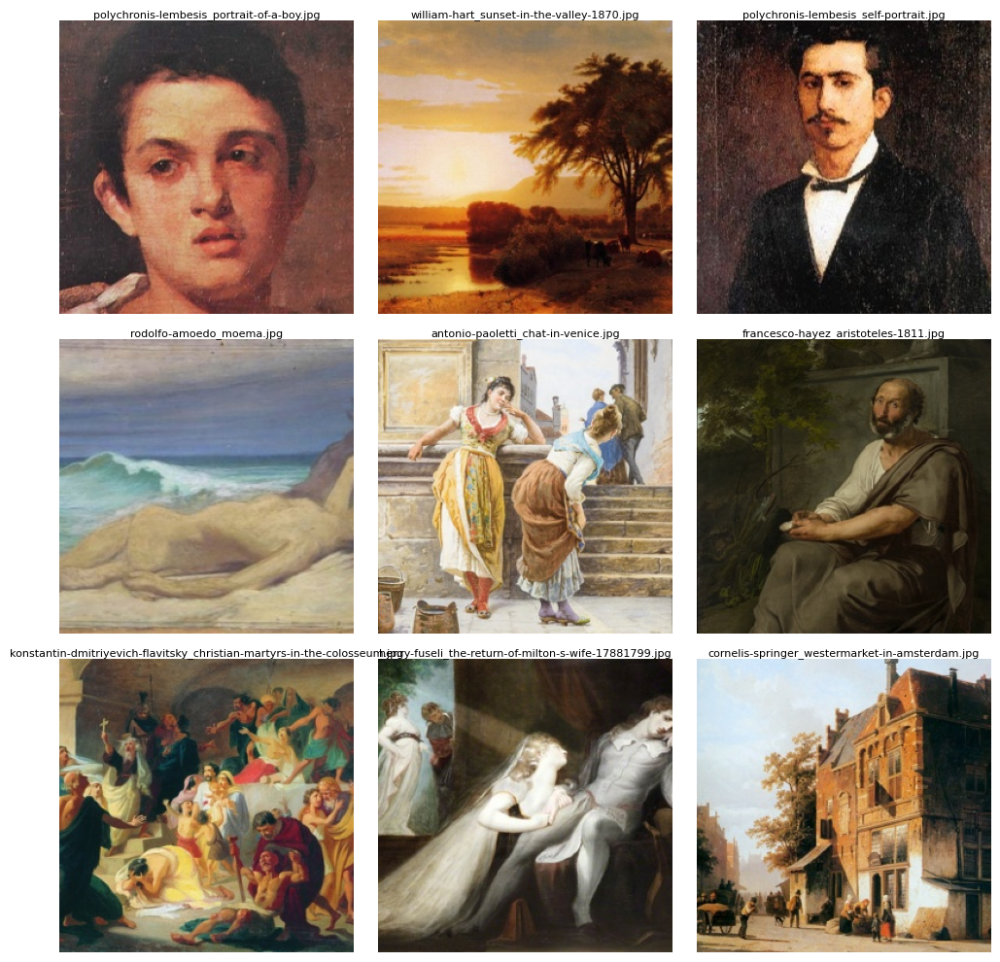

Showing 9 AI-generated images in training...
Artistic style:AI_LD_baroque


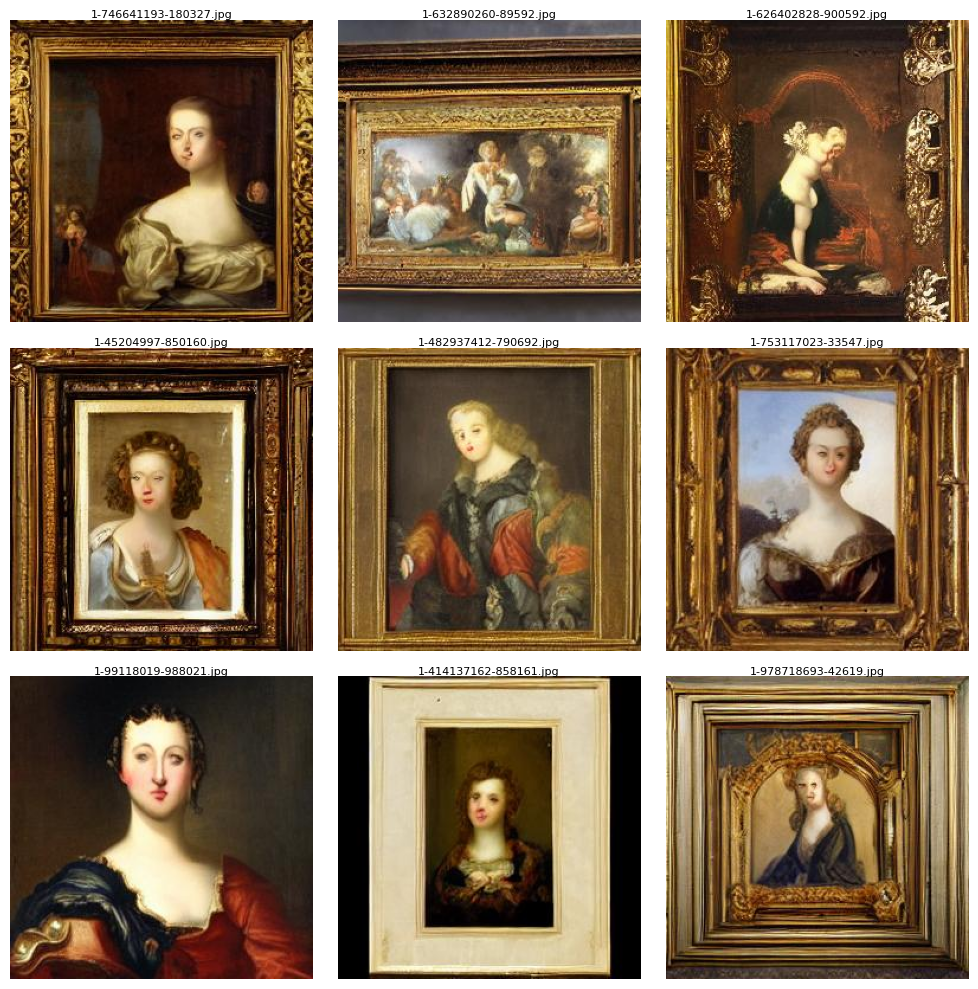

In [38]:
import random
from matplotlib import pyplot as plt
from PIL import Image
import os
import numpy as np

def plot_images(directory, k=9):
    """
    Function to plot a grid of images from a specified directory.
    Uses Pillow (PIL) for image reading instead of OpenCV.
    """
    files = os.listdir(directory)  # List all files in the directory
    im = random.choices(files, k=k)  # Select k random files
    fig = plt.figure(figsize=(10, 10))

    for i in range(k):
        im_i_path = os.path.join(directory, im[i])  # Get full path to the image
        try:
            with Image.open(im_i_path) as img:  # Open image using PIL
                img = img.convert("RGB")  # Convert to RGB if not already
            axis = fig.add_subplot(int(np.sqrt(k)), int(np.sqrt(k)), i + 1)
            axis.imshow(img)  # Display the image
            axis.axis('off')  # Turn off axis
            axis.set_title(im[i], fontsize=8, pad=2)
        except Exception as e:
            print(f"Error loading image {im[i]}: {e}")  # Handle any issues with image loading

    plt.tight_layout()
    plt.show()

# Sample 9 random human-made images
print("Showing 9 human-made images in training...")

r = random.randint(0, len(train_human) - 1)
category = os.path.basename(train_human[r])
print(f"Artistic style:{category}")
plot_images(directory=train_human[r], k=9)

# Sample 9 AI-generated images
print("Showing 9 AI-generated images in training...")
r = random.randint(0, len(train_ai) - 1)
category = os.path.basename(train_ai[r])
print(f"Artistic style:{category}")
plot_images(directory=train_ai[r], k=9)

### Data loading

In [45]:
import os
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

# Define transformations
image_transform = transforms.Compose([
    transforms.Resize((64, 64)),  # Resize to 32x32
    transforms.ToTensor(),        # Convert to PyTorch tensor
    transforms.Normalize((0.5,), (0.5,))  # Normalize to [-1, 1]
])

# Custom Dataset Class
class ArtworkDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        """
        Args:
            dataframe (pd.DataFrame): DataFrame with 'filepath' and 'label' columns.
            transform (callable, optional): A function/transform to apply to the images.
        """
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        # Get the filepath and label
        img_path = self.dataframe.iloc[idx]['filepath']
        label = self.dataframe.iloc[idx]['label']

        # Load the image
        image = Image.open(img_path).convert("RGB")  # Ensure RGB mode

        # Apply transformations if provided
        if self.transform:
            image = self.transform(image)

        return image, label

# Create datasets for train, test, and validation
train_dataset = ArtworkDataset(train_data, transform=image_transform)
test_dataset = ArtworkDataset(test_set, transform=image_transform)
val_dataset = ArtworkDataset(validation_data, transform=image_transform)

# Create DataLoaders for batching
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Example: Iterate through train_loader
for images, labels in train_loader:
    print(f"Batch of images shape: {images.shape}")
    print(f"Batch of labels: {labels}")
    
    break


Batch of images shape: torch.Size([64, 3, 64, 64])
Batch of labels: ('human_ukiyo_e', 'human_baroque', 'AI_romanticism', 'human_art_nouveau', 'AI_baroque', 'AI_ukiyo-e', 'AI_realism', 'AI_realism', 'AI_ukiyo-e', 'AI_post_impressionism', 'AI_romanticism', 'human_renaissance', 'AI_ukiyo-e', 'AI_post_impressionism', 'human_baroque', 'human_post_impressionism', 'AI_realism', 'human_expressionism', 'human_baroque', 'AI_art_nouveau', 'AI_post_impressionism', 'human_realism', 'human_realism', 'human_post_impressionism', 'human_renaissance', 'human_realism', 'human_impressionism', 'human_art_nouveau', 'AI_expressionism', 'human_post_impressionism', 'AI_baroque', 'AI_post_impressionism', 'human_ukiyo_e', 'AI_impressionism', 'human_art_nouveau', 'human_post_impressionism', 'AI_post_impressionism', 'AI_post_impressionism', 'human_surrealism', 'human_ukiyo_e', 'human_impressionism', 'AI_ukiyo-e', 'human_renaissance', 'human_art_nouveau', 'human_post_impressionism', 'human_art_nouveau', 'human_baro

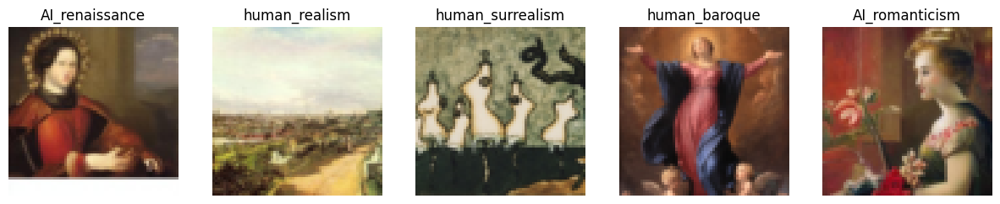

In [46]:
import matplotlib.pyplot as plt
import numpy as np

# Helper function to denormalize and convert a tensor to a NumPy array
def denormalize_and_convert(img_tensor):
    img_tensor = img_tensor.permute(1, 2, 0)  # Rearrange to HWC format
    img_tensor = img_tensor * 0.5 + 0.5  # Undo normalization ([-1, 1] to [0, 1])
    return img_tensor.numpy()

# Show images and labels from the train_loader
for images, labels in train_loader:
    fig, axes = plt.subplots(1, 5, figsize=(15, 5))  # Display 5 images
    for i in range(5):
        ax = axes[i]
        img = denormalize_and_convert(images[i])  # Denormalize
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(labels[i])  # Display label
    plt.show()
    break  # Display the first batch only


In [47]:
for images, labels in train_loader:
    print(f"Batch of images shape: {images.shape}")
    print(f"Batch of labels: {labels}")
    break

Batch of images shape: torch.Size([64, 3, 64, 64])
Batch of labels: ('AI_realism', 'human_romanticism', 'human_ukiyo_e', 'AI_expressionism', 'human_ukiyo_e', 'AI_impressionism', 'AI_baroque', 'human_ukiyo_e', 'AI_art_nouveau', 'human_impressionism', 'human_realism', 'AI_art_nouveau', 'AI_ukiyo-e', 'human_baroque', 'AI_renaissance', 'human_impressionism', 'human_romanticism', 'human_expressionism', 'AI_renaissance', 'human_renaissance', 'AI_ukiyo-e', 'AI_renaissance', 'AI_post_impressionism', 'AI_expressionism', 'AI_baroque', 'AI_renaissance', 'AI_romanticism', 'human_expressionism', 'human_renaissance', 'human_impressionism', 'human_ukiyo_e', 'AI_post_impressionism', 'AI_realism', 'human_impressionism', 'human_impressionism', 'AI_impressionism', 'AI_expressionism', 'AI_baroque', 'AI_romanticism', 'AI_expressionism', 'AI_art_nouveau', 'human_ukiyo_e', 'AI_surrealism', 'AI_renaissance', 'human_surrealism', 'human_romanticism', 'human_post_impressionism', 'human_expressionism', 'AI_baroqu